In this notebook I have worked with only the shoes belonging to Nike for solving a specific hypothetical business use case. 
With the help of the clustering techniques like K Means and Heirarchial Clustering, I have clustered the shoe models on the 
basis of their sizes, location, their order and release date and their sale and retail prices. 

The result of these clusters or groups of shoes can be of immense use to the company because they can use them to carry out 
different marketing starategies like deciding which groups of shoes to market together or to decide which shoes to use as a 
baseline for the creation of a new shoe model,etc. 

The same method of analysis can be applied the other brand and respective consulsions can be drawn

Link to dataset: https://www.kaggle.com/datasets/hudsonstuck/stockx-data-contest/data

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
df=pd.read_csv('C:/Users/utrib/StockX-Data-Contest-2019-3.csv')

In [4]:
df

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
0,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-Low-V2-Beluga,"$1,097",$220,9/24/16,11.0,California
1,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Copper,$685,$220,11/23/16,11.0,California
2,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Green,$690,$220,11/23/16,11.0,California
3,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red,"$1,075",$220,11/23/16,11.5,Kentucky
4,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red-2017,$828,$220,2/11/17,11.0,Rhode Island
...,...,...,...,...,...,...,...,...
99951,2/13/19,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,$565,$220,12/26/18,8.0,Oregon
99952,2/13/19,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,$598,$220,12/26/18,8.5,California
99953,2/13/19,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,$605,$220,12/26/18,5.5,New York
99954,2/13/19,Yeezy,adidas-Yeezy-Boost-350-V2-Static-Reflective,$650,$220,12/26/18,11.0,California


In [5]:
df.dtypes

Order Date       object
Brand            object
Sneaker Name     object
Sale Price       object
Retail Price     object
Release Date     object
Shoe Size       float64
Buyer Region     object
dtype: object

In [6]:
df.drop(df[df['Brand']!='Off-White'].index, inplace=True)
df

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
128,9/7/17,Off-White,Nike-Air-Max-90-Off-White,"$1,600",$160,9/9/17,8.0,California
129,9/7/17,Off-White,Nike-Air-Max-90-Off-White,"$1,090",$160,9/9/17,11.5,New York
130,9/7/17,Off-White,Nike-Air-Presto-Off-White,"$1,344",$160,9/9/17,10.0,New York
131,9/7/17,Off-White,Nike-Air-Presto-Off-White,"$1,325",$160,9/9/17,10.0,Massachusetts
132,9/7/17,Off-White,Nike-Air-VaporMax-Off-White,"$1,800",$250,9/9/17,12.0,Kentucky
...,...,...,...,...,...,...,...,...
99869,2/13/19,Off-White,Nike-Zoom-Fly-Off-White-Pink,$265,$170,11/28/18,11.0,New York
99870,2/13/19,Off-White,Nike-Zoom-Fly-Off-White-Pink,$331,$170,11/28/18,4.0,California
99871,2/13/19,Off-White,Nike-Zoom-Fly-Off-White-Pink,$405,$170,11/28/18,6.0,New York
99872,2/13/19,Off-White,Nike-Zoom-Fly-Off-White-Pink,$263,$170,11/28/18,10.0,Maryland


Changing the following variable datatypes:

'Release Date' and 'Order Date' to datetime

'Retail Price' and 'Sale price' to float

In [7]:
sp = [float(x[1:].replace(',', '')) for x in list(df['Sale Price'])]
df['Sale Price'] = sp
rp = [float(x[1:].replace(',', '')) for x in list(df['Retail Price'])]
df['Retail Price'] = rp

df['Release Date'] = pd.to_datetime(df['Release Date'])
df['Order Date'] = pd.to_datetime(df['Order Date'])

In [8]:
newfile=df.to_csv('data_cleaned', index=False) 
print('\nCSV String:\n', newfile)


CSV String:
 None


Creating two more additional columns:
Time Released, meaning how much time the sneaker was released on market, and Profit, which is the (Sale Price - Retail Price)

In [9]:
df['Time Released'] = ((df['Order Date'] - df['Release Date'])/ np.timedelta64(1, 'M')).astype(int) # in months

In [10]:
df['Profit'] = (df['Sale Price'] - df['Retail Price'])

In [11]:
df.head()

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Time Released,Profit
128,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1600.0,160.0,2017-09-09,8.0,California,0,1440.0
129,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1090.0,160.0,2017-09-09,11.5,New York,0,930.0
130,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1344.0,160.0,2017-09-09,10.0,New York,0,1184.0
131,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1325.0,160.0,2017-09-09,10.0,Massachusetts,0,1165.0
132,2017-09-07,Off-White,Nike-Air-VaporMax-Off-White,1800.0,250.0,2017-09-09,12.0,Kentucky,0,1550.0


In [12]:
df

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Time Released,Profit
128,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1600.0,160.0,2017-09-09,8.0,California,0,1440.0
129,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1090.0,160.0,2017-09-09,11.5,New York,0,930.0
130,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1344.0,160.0,2017-09-09,10.0,New York,0,1184.0
131,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1325.0,160.0,2017-09-09,10.0,Massachusetts,0,1165.0
132,2017-09-07,Off-White,Nike-Air-VaporMax-Off-White,1800.0,250.0,2017-09-09,12.0,Kentucky,0,1550.0
...,...,...,...,...,...,...,...,...,...,...
99869,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,265.0,170.0,2018-11-28,11.0,New York,2,95.0
99870,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,331.0,170.0,2018-11-28,4.0,California,2,161.0
99871,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,405.0,170.0,2018-11-28,6.0,New York,2,235.0
99872,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,263.0,170.0,2018-11-28,10.0,Maryland,2,93.0


In [13]:
df.head()
df.drop(columns=['Order Date'])
df=df.reset_index()

In [14]:
df=df.drop(columns=['index'])
df

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Time Released,Profit
0,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1600.0,160.0,2017-09-09,8.0,California,0,1440.0
1,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1090.0,160.0,2017-09-09,11.5,New York,0,930.0
2,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1344.0,160.0,2017-09-09,10.0,New York,0,1184.0
3,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1325.0,160.0,2017-09-09,10.0,Massachusetts,0,1165.0
4,2017-09-07,Off-White,Nike-Air-VaporMax-Off-White,1800.0,250.0,2017-09-09,12.0,Kentucky,0,1550.0
...,...,...,...,...,...,...,...,...,...,...
27789,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,265.0,170.0,2018-11-28,11.0,New York,2,95.0
27790,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,331.0,170.0,2018-11-28,4.0,California,2,161.0
27791,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,405.0,170.0,2018-11-28,6.0,New York,2,235.0
27792,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,263.0,170.0,2018-11-28,10.0,Maryland,2,93.0


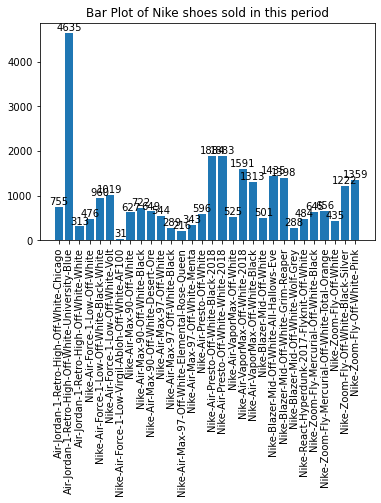

<Figure size 432x288 with 0 Axes>

In [17]:
#Bar plot of Nikes' sell
figure, axis = plt.subplots()
plt.xticks(range(len(yzy_count.index)), list(yzy_count.index), rotation = 90)
plot = axis.bar(yzy_count.index, yzy_count['Order Date'])
for rectangle in plot:
    height = rectangle.get_height()
    axis.text(rectangle.get_x() + rectangle.get_width() /2., 1.002 *
        height,'%d' % int(height), ha='center', va = 'bottom')
    
plt.title('Bar Plot of Nike shoes sold in this period')
plt.show()
plt.tight_layout()

axis.spines['top'].set_visible(False)
axis.spines['right'].set_visible(False)
axis.spines['left'].set_visible(False)
axis.spines['bottom'].set_color('#DDDDDD')

# Second, remove the ticks as well.
axis.tick_params(bottom=False, left=False)

# Third, add a horizontal grid (but keep the vertical grid hidden).
# Color the lines a light gray as well.
axis.set_axisbelow(True)
axis.yaxis.grid(True, color='#EEEEEE')
axis.xaxis.grid(False)




axis.spines['top'].set_visible(False)
axis.spines['right'].set_visible(False)
axis.spines['left'].set_visible(False)
axis.spines['bottom'].set_color('#DDDDDD')
axis.tick_params(bottom=False, left=False)
axis.set_axisbelow(True)
axis.yaxis.grid(True, color='#EEEEEE')
axis.xaxis.grid(False)




axis.set_xlabel('Shoe Model name', labelpad=15, color='#333333')
axis.set_ylabel('Number of shoes', labelpad=15, color='#333333')
axis.set_title('Number of shoes sold of each Nike model', pad=15, color='#333333',
             weight='bold')
plt.tight_layout()

In [18]:
df

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Time Released,Profit
0,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1600.0,160.0,2017-09-09,8.0,California,0,1440.0
1,2017-09-07,Off-White,Nike-Air-Max-90-Off-White,1090.0,160.0,2017-09-09,11.5,New York,0,930.0
2,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1344.0,160.0,2017-09-09,10.0,New York,0,1184.0
3,2017-09-07,Off-White,Nike-Air-Presto-Off-White,1325.0,160.0,2017-09-09,10.0,Massachusetts,0,1165.0
4,2017-09-07,Off-White,Nike-Air-VaporMax-Off-White,1800.0,250.0,2017-09-09,12.0,Kentucky,0,1550.0
...,...,...,...,...,...,...,...,...,...,...
27789,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,265.0,170.0,2018-11-28,11.0,New York,2,95.0
27790,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,331.0,170.0,2018-11-28,4.0,California,2,161.0
27791,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,405.0,170.0,2018-11-28,6.0,New York,2,235.0
27792,2019-02-13,Off-White,Nike-Zoom-Fly-Off-White-Pink,263.0,170.0,2018-11-28,10.0,Maryland,2,93.0


In [19]:
pip install kmodes

Note: you may need to restart the kernel to use updated packages.


In [20]:
pip install --upgrade kmodes

Note: you may need to restart the kernel to use updated packages.


In [21]:
print(df['Shoe Size'].unique())
print(df['Buyer Region'].unique())
print(df['Sneaker Name'].unique())



[ 8.  11.5 10.  12.  13.  11.   9.  10.5  9.5  6.   8.5  7.   7.5 14.
  4.5  6.5  5.5  5.   4.  12.5 15.   3.5 16.  17. ]
['California' 'New York' 'Massachusetts' 'Kentucky' 'Illinois'
 'New Jersey' 'Colorado' 'Florida' 'Delaware' 'Virginia' 'Ohio' 'Oregon'
 'South Carolina' 'Nevada' 'Arizona' 'Texas' 'Wisconsin' 'Rhode Island'
 'Connecticut' 'Michigan' 'Maryland' 'Alabama' 'Pennsylvania' 'Georgia'
 'Tennessee' 'Arkansas' 'Washington' 'Alaska' 'Oklahoma' 'Indiana'
 'North Carolina' 'Utah' 'New Hampshire' 'Minnesota' 'Iowa' 'Missouri'
 'Hawaii' 'Vermont' 'Maine' 'Mississippi' 'District of Columbia'
 'Nebraska' 'Louisiana' 'Idaho' 'New Mexico' 'West Virginia' 'Kansas'
 'Montana' 'North Dakota' 'South Dakota' 'Wyoming']
['Nike-Air-Max-90-Off-White' 'Nike-Air-Presto-Off-White'
 'Nike-Air-VaporMax-Off-White' 'Air-Jordan-1-Retro-High-Off-White-Chicago'
 'Nike-Blazer-Mid-Off-White' 'Nike-Air-Force-1-Low-Off-White'
 'Nike-Air-Max-97-Off-White'
 'Nike-Air-Force-1-Low-Virgil-Abloh-Off-White-AF10

In [22]:
print(df['Shoe Size'].value_counts())
print(df['Buyer Region'].value_counts())
print(df['Sneaker Name'].value_counts())

10.0    3654
11.0    3109
9.0     2703
10.5    2537
9.5     2255
12.0    2255
8.0     1723
13.0    1591
8.5     1381
11.5    1142
7.0     1114
6.0      883
7.5      668
6.5      589
5.0      544
4.0      471
14.0     397
4.5      288
5.5      287
15.0     130
12.5      65
16.0       4
3.5        3
17.0       1
Name: Shoe Size, dtype: int64
California              6236
New York                4422
Oregon                  2285
Florida                 1892
Texas                   1421
New Jersey              1349
Illinois                1050
Massachusetts            714
Pennsylvania             713
Virginia                 605
Michigan                 553
Georgia                  528
Maryland                 526
Ohio                     504
Washington               501
Delaware                 424
Arizona                  393
North Carolina           346
Connecticut              266
Colorado                 252
Nevada                   249
Indiana                  239
Wisconsin           

In [23]:
one_hot_encoded_data = pd.get_dummies(df, columns = ['Shoe Size', 'Buyer Region','Sneaker Name'])
one_hot_encoded_data 

,Order Date,Brand,Sale Price,Retail Price,Release Date,Time Released,Profit,Shoe Size_3.5,Shoe Size_4.0,Shoe Size_4.5,...,Sneaker Name_Nike-Blazer-Mid-Off-White,Sneaker Name_Nike-Blazer-Mid-Off-White-All-Hallows-Eve,Sneaker Name_Nike-Blazer-Mid-Off-White-Grim-Reaper,Sneaker Name_Nike-Blazer-Mid-Off-White-Wolf-Grey,Sneaker Name_Nike-React-Hyperdunk-2017-Flyknit-Off-White,Sneaker Name_Nike-Zoom-Fly-Mercurial-Off-White-Black,Sneaker Name_Nike-Zoom-Fly-Mercurial-Off-White-Total-Orange,Sneaker Name_Nike-Zoom-Fly-Off-White,Sneaker Name_Nike-Zoom-Fly-Off-White-Black-Silver,Sneaker Name_Nike-Zoom-Fly-Off-White-Pink
0,2017-09-07,Off-White,1600.0,160.0,2017-09-09,0,1440.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2017-09-07,Off-White,1090.0,160.0,2017-09-09,0,930.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2017-09-07,Off-White,1344.0,160.0,2017-09-09,0,1184.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2017-09-07,Off-White,1325.0,160.0,2017-09-09,0,1165.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2017-09-07,Off-White,1800.0,250.0,2017-09-09,0,1550.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27789,2019-02-13,Off-White,265.0,170.0,2018-11-28,2,95.0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
27790,2019-02-13,Off-White,331.0,170.0,2018-11-28,2,161.0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
27791,2019-02-13,Off-White,405.0,170.0,2018-11-28,2,235.0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
27792,2019-02-13,Off-White,263.0,170.0,2018-11-28,2,93.0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [24]:
df_new=one_hot_encoded_data.drop(columns=['Order Date','Release Date','Brand','Sale Price','Retail Price'])

In [25]:
df_new

,Time Released,Profit,Shoe Size_3.5,Shoe Size_4.0,Shoe Size_4.5,Shoe Size_5.0,Shoe Size_5.5,Shoe Size_6.0,Shoe Size_6.5,Shoe Size_7.0,...,Sneaker Name_Nike-Blazer-Mid-Off-White,Sneaker Name_Nike-Blazer-Mid-Off-White-All-Hallows-Eve,Sneaker Name_Nike-Blazer-Mid-Off-White-Grim-Reaper,Sneaker Name_Nike-Blazer-Mid-Off-White-Wolf-Grey,Sneaker Name_Nike-React-Hyperdunk-2017-Flyknit-Off-White,Sneaker Name_Nike-Zoom-Fly-Mercurial-Off-White-Black,Sneaker Name_Nike-Zoom-Fly-Mercurial-Off-White-Total-Orange,Sneaker Name_Nike-Zoom-Fly-Off-White,Sneaker Name_Nike-Zoom-Fly-Off-White-Black-Silver,Sneaker Name_Nike-Zoom-Fly-Off-White-Pink
0,0,1440.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,930.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,1184.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,1165.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1550.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27789,2,95.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
27790,2,161.0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
27791,2,235.0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
27792,2,93.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [26]:

import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.cluster import KMeans
import sklearn.cluster as cluster
import sklearn.metrics as metrics

Method 1 for finding the value of k

- by the elbow method

In [27]:
K=range(2,12)
wss = []

for k in K:
    kmeans=cluster.KMeans(n_clusters=k)
    kmeans=kmeans.fit(df_new)
    wss_iter = kmeans.inertia_
    wss.append(wss_iter)

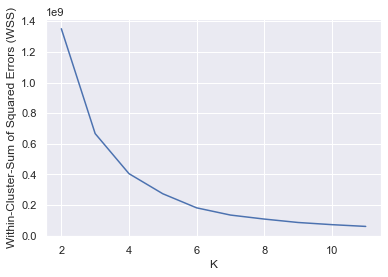

In [28]:
plt.xlabel('K')
plt.ylabel('Within-Cluster-Sum of Squared Errors (WSS)')
plt.plot(K,wss)

Method 2 for finding the value of k

- by the Silhouette method

In [29]:
import sklearn.cluster as cluster
import sklearn.metrics as metrics
for i in range(2,13):
    labels=cluster.KMeans(n_clusters=i,random_state=200).fit(df_new).labels_
    print ("Silhouette score for k(clusters) = "+str(i)+" is "
    +str(metrics.silhouette_score(df_new,labels,metric="euclidean",sample_size=1000,random_state=200)))

Silhouette score for k(clusters) = 2 is 0.6956602511155714
Silhouette score for k(clusters) = 3 is 0.5435560502380281
Silhouette score for k(clusters) = 4 is 0.5511745562609103
Silhouette score for k(clusters) = 5 is 0.5781559100547334
Silhouette score for k(clusters) = 6 is 0.590023771913025
Silhouette score for k(clusters) = 7 is 0.5874694809996458
Silhouette score for k(clusters) = 8 is 0.5509538098322514
Silhouette score for k(clusters) = 9 is 0.553109026676815
Silhouette score for k(clusters) = 10 is 0.5397236857699599
Silhouette score for k(clusters) = 11 is 0.5327609654541237
Silhouette score for k(clusters) = 12 is 0.5402093572902602


In [30]:
kmeans = cluster.KMeans(n_clusters=4 ,init="k-means++")
X=df_new.iloc[:,:].values
y_kmeans = kmeans.fit_predict(X)
kmeans = kmeans.fit(X)


#sns.scatterplot(x='Time Released',y='Profit',hue =None, data=df_new, palette='viridis')

In [31]:
y_kmeans = kmeans.fit_predict(X)
print(y_kmeans)

[2 1 1 ... 0 0 0]


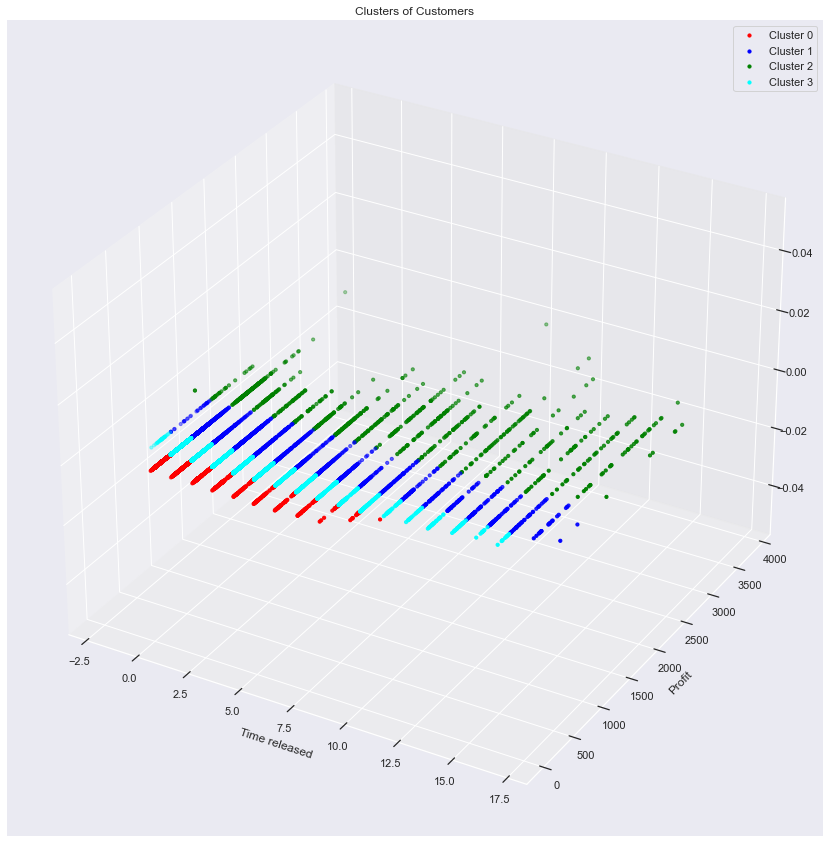

In [32]:
fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(X[y_kmeans==0, 0], X[y_kmeans==0, 1], s=10, c='red', label ='Cluster 0')
plt.scatter(X[y_kmeans==1, 0], X[y_kmeans==1, 1], s=10, c='blue', label ='Cluster 1')
plt.scatter(X[y_kmeans==2, 0], X[y_kmeans==2, 1], s=10, c='green', label ='Cluster 2')
plt.scatter(X[y_kmeans==3, 0], X[y_kmeans==3, 1], s=10, c='cyan', label ='Cluster 3')
#plt.scatter(X[y_kmeans==4, 0], X[y_kmeans==4, 1], s=10, c='magenta', label ='Cluster 4')
#plt.scatter(X[y_kmeans==5, 0], X[y_kmeans==5, 1], s=10, c='black', label ='Cluster 5')
plt.legend()

#Plot the centroid. This time we're going to use the cluster centres  #attribute that returns here the coordinates of the centroid.
#plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='yellow', label = 'Centroids')
plt.title('Clusters of Customers')
plt.xlabel('Time released')
plt.ylabel('Profit')
plt.show()



In [33]:
#kmeans.inertia

In [34]:

clusterDataFrame=pd.DataFrame(y_kmeans)
clusterDataFrame.columns=['Cluster predicted']
#combinedDF=pd.concat([df_new,clusterDF],axis=1)
clusterDataFrame


,Cluster predicted
0,2
1,1
2,1
3,1
4,2
...,...
27789,0
27790,0
27791,0
27792,0


In [35]:
print(clusterDataFrame['Cluster predicted'].unique())
print(clusterDataFrame['Cluster predicted'].value_counts())


[2 1 3 0]
3    14601
0     7911
1     4283
2      999
Name: Cluster predicted, dtype: int64


In [36]:
combinedDataframe=pd.concat([df,clusterDataFrame],axis=1)
combinedDataframe1=combinedDataframe.drop(columns=['Order Date','Release Date','Sale Price','Retail Price','Brand'])
combinedDataframe1

,Sneaker Name,Shoe Size,Buyer Region,Time Released,Profit,Cluster predicted
0,Nike-Air-Max-90-Off-White,8.0,California,0,1440.0,2
1,Nike-Air-Max-90-Off-White,11.5,New York,0,930.0,1
2,Nike-Air-Presto-Off-White,10.0,New York,0,1184.0,1
3,Nike-Air-Presto-Off-White,10.0,Massachusetts,0,1165.0,1
4,Nike-Air-VaporMax-Off-White,12.0,Kentucky,0,1550.0,2
...,...,...,...,...,...,...
27789,Nike-Zoom-Fly-Off-White-Pink,11.0,New York,2,95.0,0
27790,Nike-Zoom-Fly-Off-White-Pink,4.0,California,2,161.0,0
27791,Nike-Zoom-Fly-Off-White-Pink,6.0,New York,2,235.0,0
27792,Nike-Zoom-Fly-Off-White-Pink,10.0,Maryland,2,93.0,0


In [37]:
import plotly.express as px
df = combinedDataframe1
fig = px.scatter_3d(df, x='Time Released', y='Profit', z='Cluster predicted',
                    color='Buyer Region')
fig.show()

In [38]:
fig = px.scatter_3d(df, x='Time Released', y='Profit', z='Cluster predicted',
                    color='Sneaker Name')
fig.show()

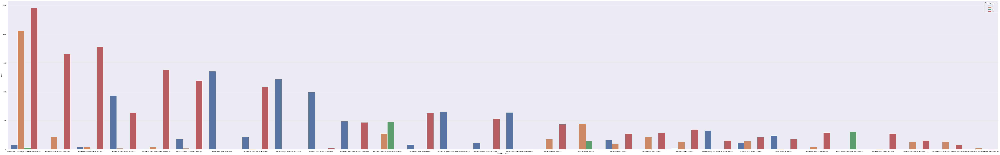

In [39]:
plt.subplots(figsize = (130,20))
sns.countplot(x=combinedDataframe1['Sneaker Name'],order=combinedDataframe1['Sneaker Name'].value_counts().index,hue=combinedDataframe1['Cluster predicted'])
plt.show()

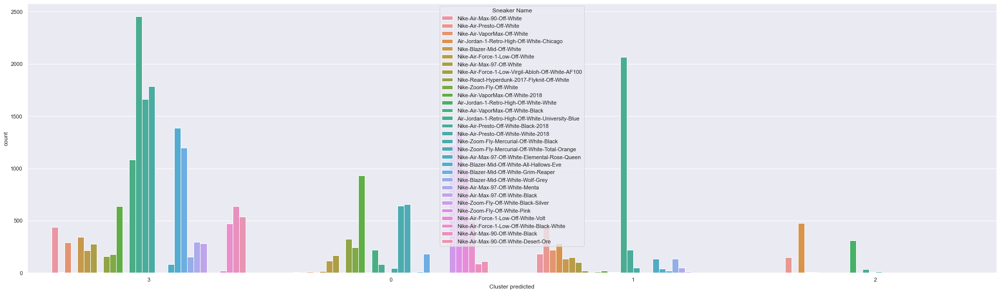

In [40]:
plt.subplots(figsize = (35,10))
sns.countplot(x=combinedDataframe1['Cluster predicted'],order=combinedDataframe1['Cluster predicted'].value_counts().index,hue=combinedDataframe1['Sneaker Name'])
plt.show()


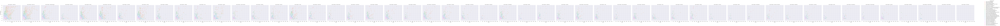

In [41]:
sns.relplot(
    data=combinedDataframe1, x="Profit", y="Time Released",
    col="Buyer Region", hue="Sneaker Name", style="Sneaker Name",
    kind="scatter"
)

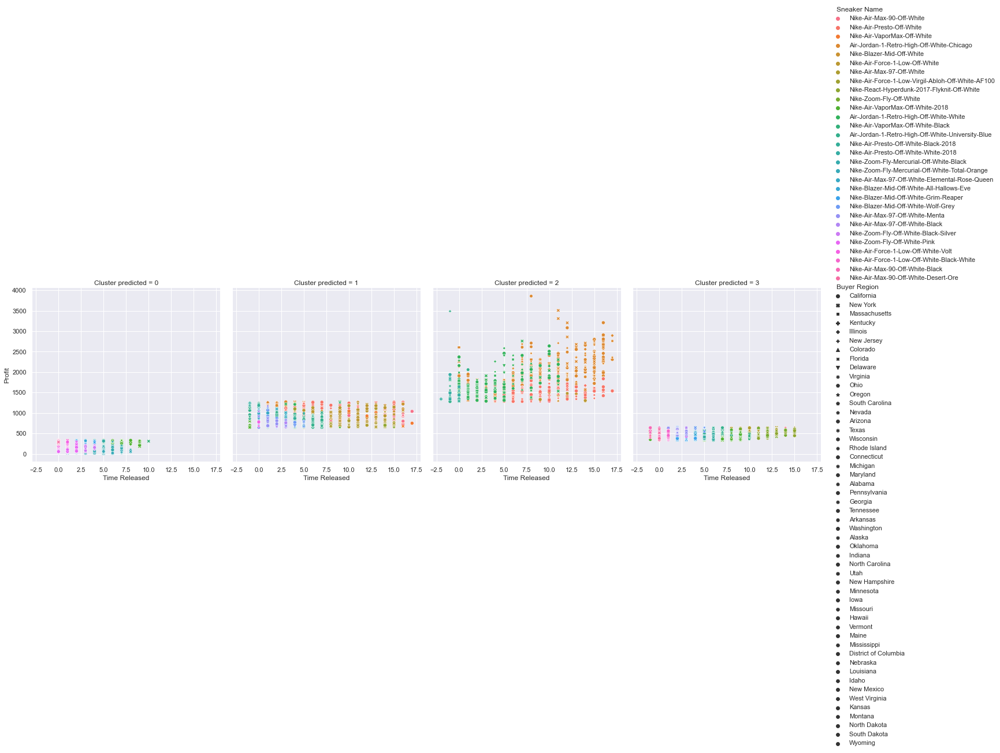

In [42]:
sns.relplot(
    data=combinedDataframe1, x="Time Released", y="Profit",
    col="Cluster predicted", hue="Sneaker Name", style="Buyer Region",
    kind="scatter"
)

In [43]:
#!pip install plotly config --global http.sslVerify false
!pip install plotly

In [44]:


import plotly.express as px
df = combinedDataframe1

fig = px.scatter(df, x="Cluster predicted", y="Profit", color="Sneaker Name")
fig.show()


In [45]:
fig = px.scatter(df, x="Cluster predicted", y="Profit", color="Cluster predicted")
fig.show()


Approach 2: By using Heirarchial Clustering 

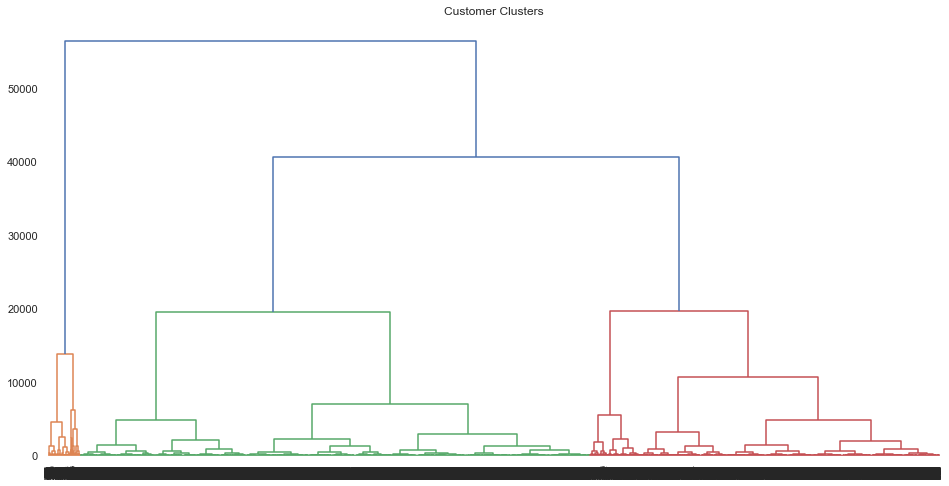

In [48]:

import scipy.cluster.hierarchy as sch

# graph size
plt.figure(1, figsize = (16 ,8))

# creating the dendrogram
dendrogram = sch.dendrogram(sch.linkage(df_new, method  = "ward"))

# ploting graphabs
plt.title('Customer Clusters')
#plt.xlabel('Customers')
#plt.ylabel('Euclidean distances')
plt.show()

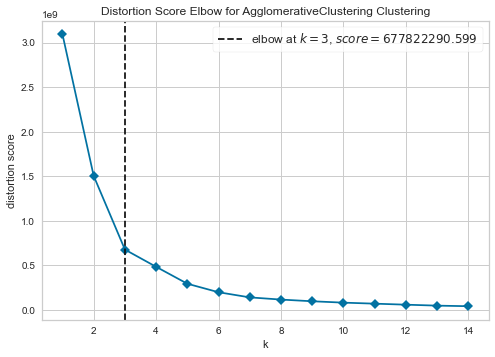

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [49]:

from sklearn.cluster import AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer
model = AgglomerativeClustering()

# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(1,15), timings=False)
# Fit data to visualizer
visualizer.fit(df_new)
# Finalize and render figure
visualizer.show()

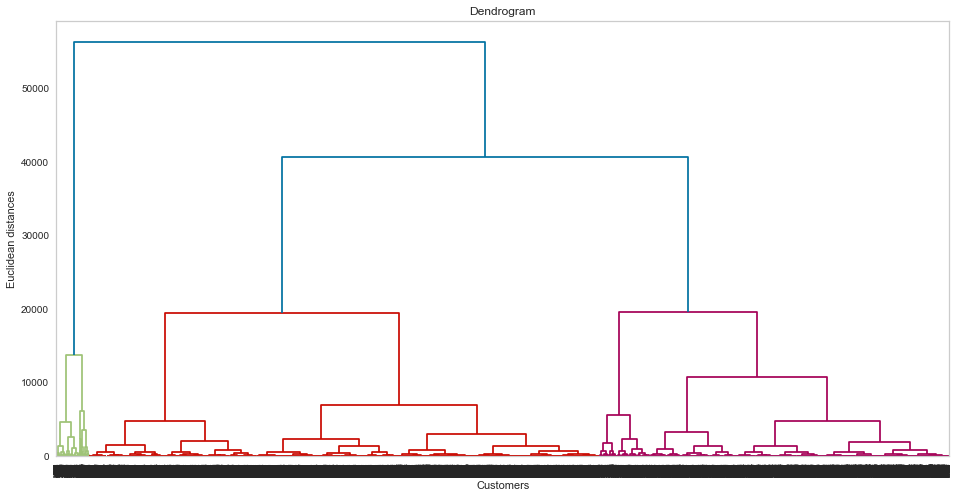

In [50]:
import scipy.cluster.hierarchy as sch

# size of image
plt.figure(1, figsize = (16 ,8))  
plt.grid(b=None)

# creating the dendrogram 
dend = sch.dendrogram(sch.linkage(df_new, method='ward'))

# theroshold
#plt.axhline(y=30670, color='orange')

# ploting graphabs
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

Hence Nike can use these clusters of shoes while carrying out their various business endeavors 
like promoting together with a select group of shoes or using them as a baseline for the creation 
of a new shoe model, additionally having the estimated profit margins as a reference.
